Chapter 20
# 不同三元瑞利商
Book_2《可视之美》 | 鸢尾花书：从加减乘除到机器学习  

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm
import plotly.graph_objects as go

# import os
# # 如果文件夹不存在，创建文件夹
# if not os.path.isdir("Figures"):
#     os.makedirs("Figures")

In [2]:
# 设置步数
intervals = 50
ntheta = intervals
nphi = 2*intervals

# 单位球，球坐标
# theta取值范围为 [0, pi]
theta = np.linspace(0, np.pi*1, ntheta+1)
# phi取值范围为 [0, 2*pi]
phi   = np.linspace(0, np.pi*2, nphi+1)

# 单位球半径
r = 1 

# 球坐标转化为三维直角坐标 
pp_,tt_ = np.meshgrid(phi,theta)

# z轴坐标网格数据
Z = r*np.cos(tt_)

# x轴坐标网格数据
X = r*np.sin(tt_)*np.cos(pp_)

# y轴坐标网格数据
Y = r*np.sin(tt_)*np.sin(pp_)


In [3]:
# 每一行代表一个三维直角坐标系坐标点
# 所有坐标点都在单位球面上
Points = np.column_stack([X.ravel(), Y.ravel(), Z.ravel()])

In [4]:
def visualize_Q(Q, title):
    Rayleigh_Q = np.diag(Points @ Q @ Points.T)
    Rayleigh_Q_ = np.reshape(Rayleigh_Q,X.shape)
    print('Rayleigh_Q_.min()')
    print(Rayleigh_Q_.min())
    
    print('Rayleigh_Q_.max()')
    print(Rayleigh_Q_.max())    

    # norm_plt = plt.Normalize(Rayleigh_Q_.min(), Rayleigh_Q_.max())
    norm_plt = plt.Normalize(-3, 3)
    colors = cm.RdYlBu_r(norm_plt(Rayleigh_Q_))

    fig = plt.figure(figsize = (8,4))
    ax = fig.add_subplot(121, projection='3d')
    surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, facecolors=colors,
                   linewidth=0.25, shade=False)

    # surf.set_facecolor((0,0,0,0))

    ax.set_proj_type('ortho')
    # 另外一种设定正交投影的方式

    ax.set_xlabel('$\it{x_1}$')
    ax.set_ylabel('$\it{x_2}$')
    ax.set_zlabel('$\it{x_3}$')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    k = 1.5
    # three reference lines
    ax.plot((-k, k), (0, 0), (0, 0), 'k')
    ax.plot((0, 0), (-k, k), (0, 0), 'k')
    ax.plot((0, 0), (0, 0), (-k, k), 'k')
    ax.axis('off')
    ax.set_xlim((-k, k))
    ax.set_ylim((-k, k))
    ax.set_zlim((-k, k))
    ax.set_box_aspect([1,1,1])
    ax.view_init(azim=-130, elev=25)
    ax.grid(False)
    
    
    ax = fig.add_subplot(122)
    levels = np.linspace(-3,3,25)

    colorbar = ax.contourf(pp_,
                           tt_, 
                           Rayleigh_Q_, levels = levels, cmap='RdYlBu_r')
    ax.contour(pp_,tt_, Rayleigh_Q_, levels = levels, colors = 'w')
    
    fig.colorbar(colorbar, ax=ax, shrink = 0.38)
    ax.set_ylim(tt_.min(), tt_.max())
    ax.set_xlim(pp_.min(), pp_.max())
    ax.set_xlabel(r'$\phi$')
    ax.set_ylabel(r'$\theta$', rotation=0)
    ax.set_xticks(np.linspace(0, 2*np.pi, 3))
    ax.set_xticklabels(['0',
                        r'$\pi/2 (90^\circ)$',
                        r'$\pi (180^\circ)$'])

    ax.set_yticks(np.linspace(0, np.pi, 3))
    ax.set_yticklabels(['0',
                        r'$\pi/2 (90^\circ)$',
                        r'$\pi (180^\circ)$'])
    ax.invert_yaxis()
    plt.axis('scaled')
    fig.savefig(title + '.svg', format='svg')

In [5]:
def plotly_Q(Q):
    Rayleigh_Q = np.diag(Points @ Q @ Points.T)
    Rayleigh_Q_ = np.reshape(Rayleigh_Q,X.shape)
    fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z, 
                                     surfacecolor=Rayleigh_Q_, 
                                     cmax = 3,cmin = -3,
                                     colorscale='RdYlBu_r')])
   
    fig.update_layout(
    autosize=False,
    width =800,
    height=600,
    margin=dict(l=65, r=50, b=65, t=90))
    fig.layout.scene.camera.projection.type = "orthographic"
    fig.show()

Rayleigh_Q_.min()
1.0
Rayleigh_Q_.max()
3.0


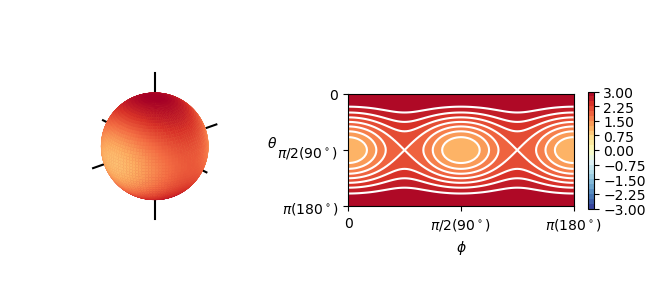

In [6]:
# 定义矩阵Q # 正定
Q1 = np.array([[1, 0, 0],
              [0, 2, 0],
              [0, 0, 3]])
visualize_Q(Q1,'Q1')

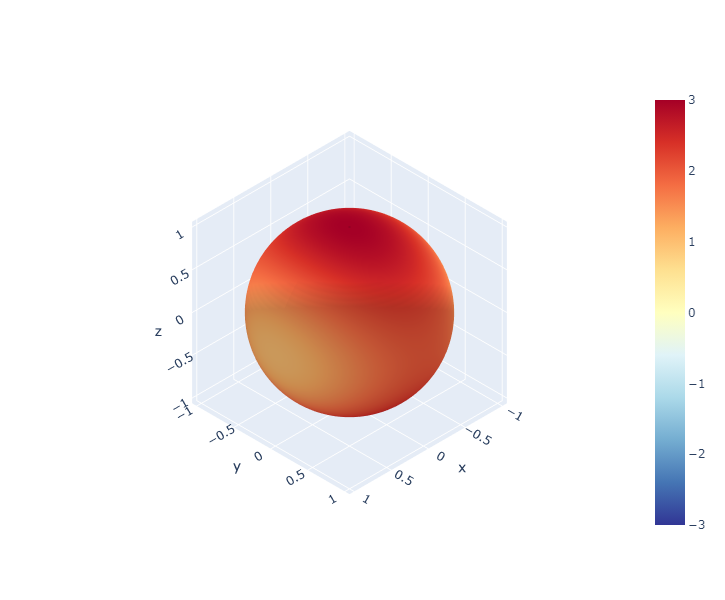

In [7]:
plotly_Q(Q1)

Rayleigh_Q_.min()
1.0344233825612026e-31
Rayleigh_Q_.max()
3.0


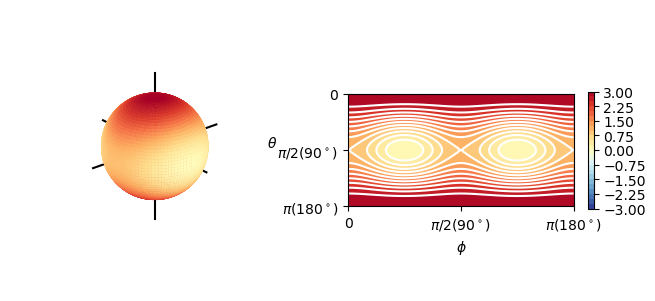

In [8]:
# 定义矩阵Q # 半正定
Q2 = np.array([[1, 0, 0],
              [0, 0, 0],
              [0, 0, 3]])
visualize_Q(Q2,'Q2')

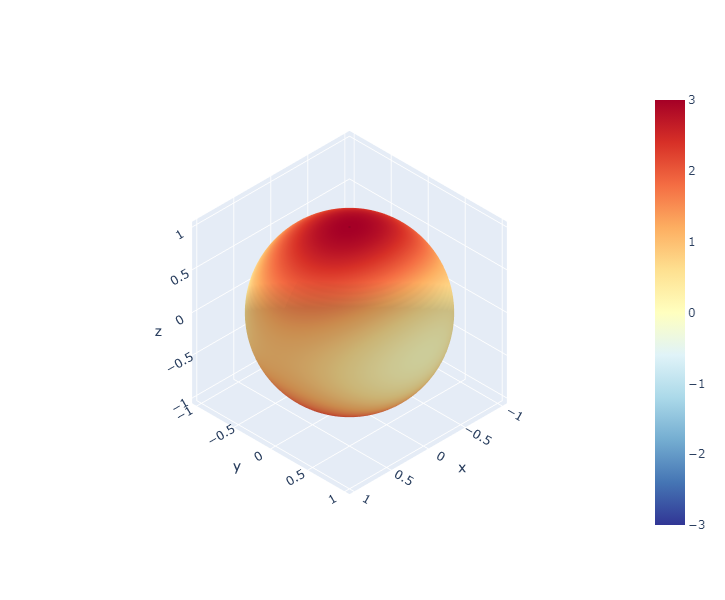

In [9]:
plotly_Q(Q2)

Rayleigh_Q_.min()
-3.0
Rayleigh_Q_.max()
-1.0


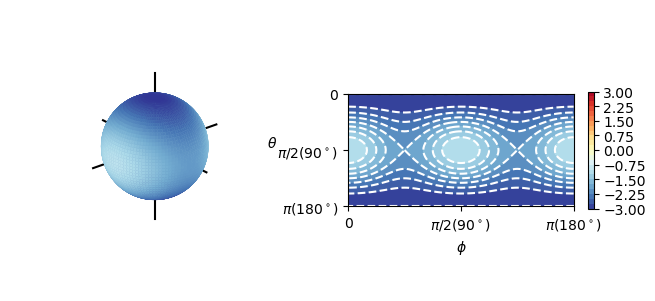

In [10]:
# 定义矩阵Q, 负定
Q3 = np.array([[-1, 0, 0],
              [0, -2, 0],
              [0, 0, -3]])
visualize_Q(Q3,'Q3')

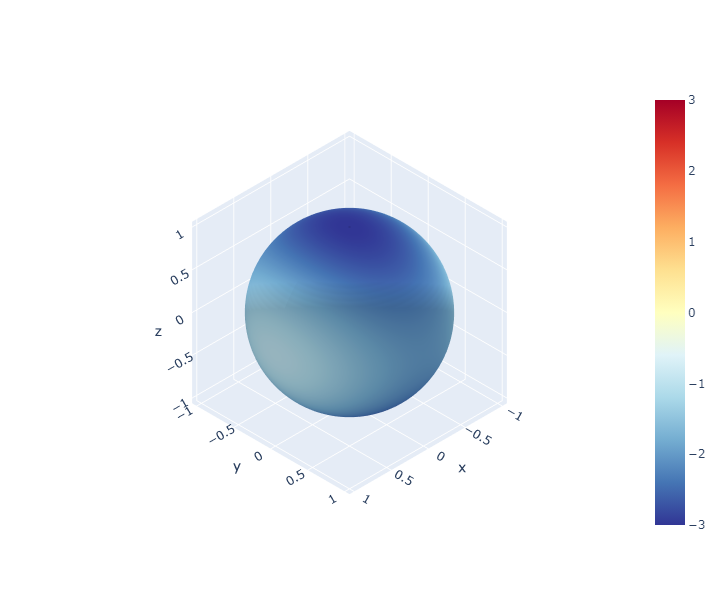

In [11]:
plotly_Q(Q3)

Rayleigh_Q_.min()
-3.0
Rayleigh_Q_.max()
-1.0344233825612026e-31


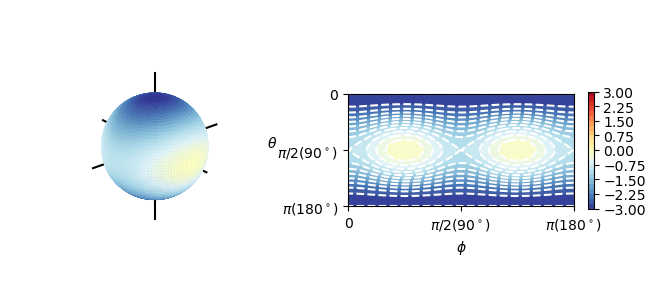

In [12]:
# 定义矩阵Q，半负定
Q4 = np.array([[-1, 0, 0],
              [0, 0, 0],
              [0, 0, -3]])
visualize_Q(Q4,'Q4')

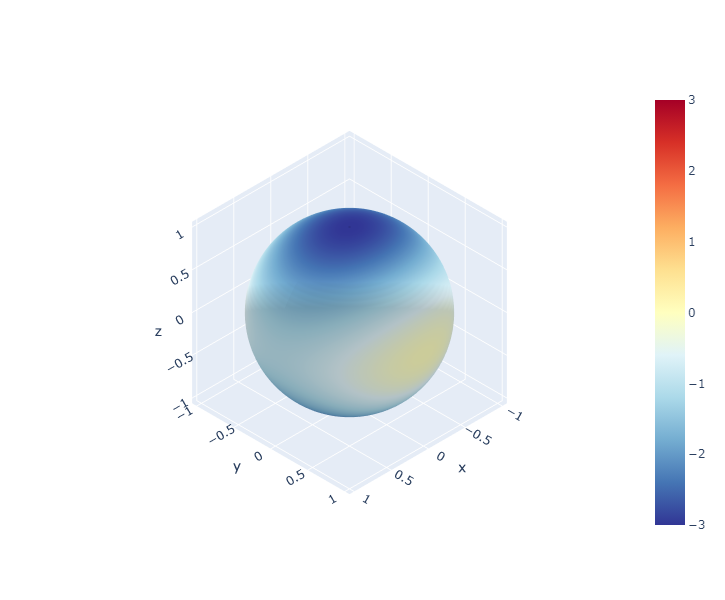

In [13]:
plotly_Q(Q4)

Rayleigh_Q_.min()
-0.9980267284282716
Rayleigh_Q_.max()
0.9980267284282717


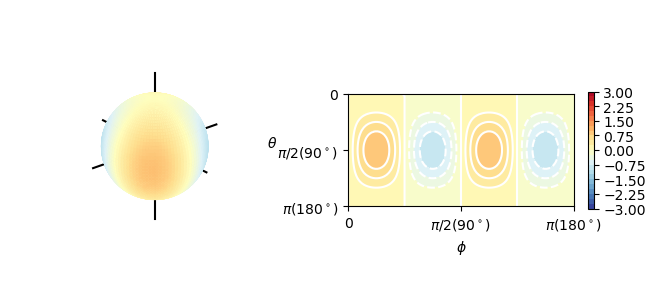

In [14]:
# 定义矩阵Q，不定
Q5 = np.array([[0, 1, 0],
              [1, 0, 0],
              [0, 0, 0]])
visualize_Q(Q5,'Q5')

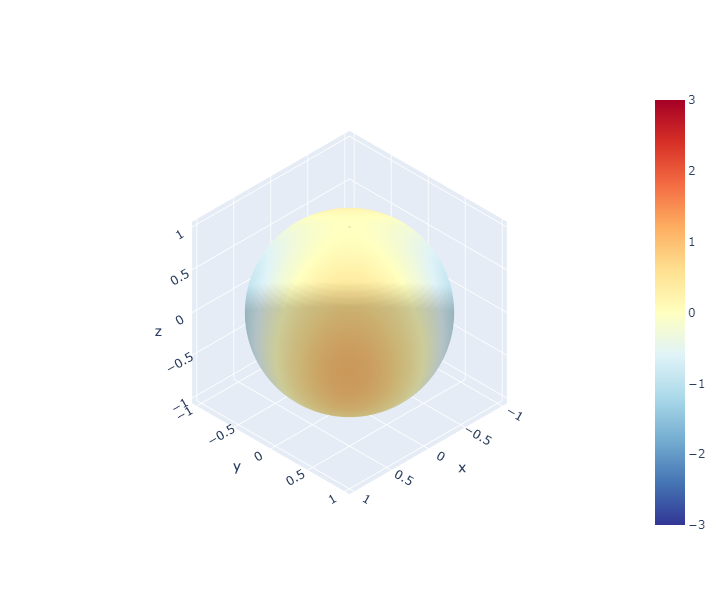

In [15]:
plotly_Q(Q5)

Rayleigh_Q_.min()
-2.0
Rayleigh_Q_.max()
3.0


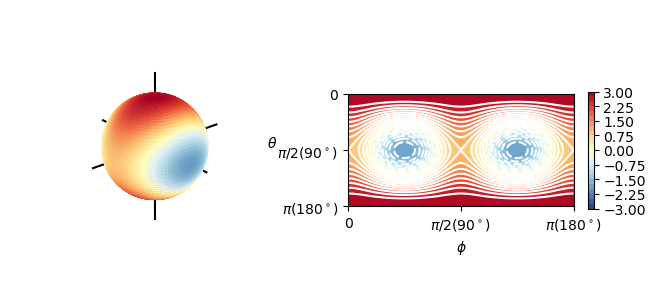

In [16]:


# 定义矩阵Q, 不定
Q6 = np.array([[1, 0, 0],
              [0, -2, 0],
              [0, 0, 3]])
visualize_Q(Q6,'Q6')

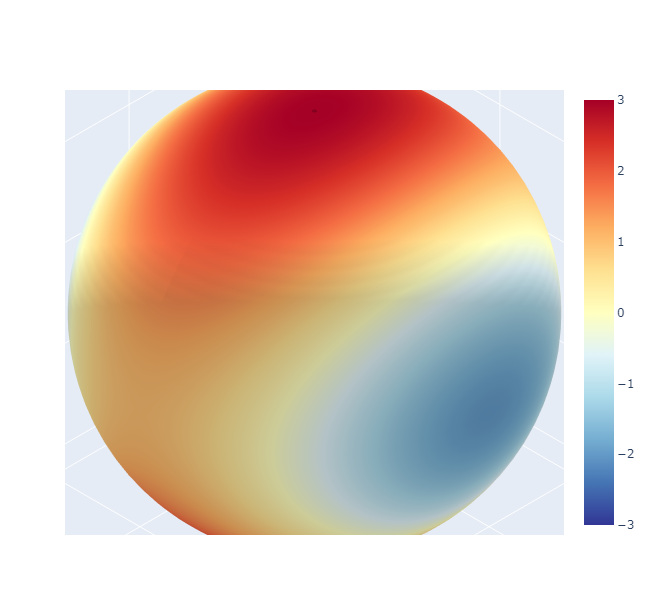

In [17]:
plotly_Q(Q6)

Rayleigh_Q_.min()
-1.0
Rayleigh_Q_.max()
1.0000000000000002


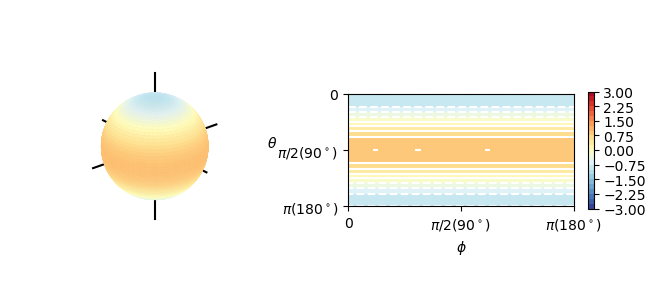

In [18]:
# 定义矩阵Q, 不定
Q7 = np.array([[1, 0, 0],
              [0, 1, 0],
              [0, 0, -1]])
visualize_Q(Q7,'Q7')

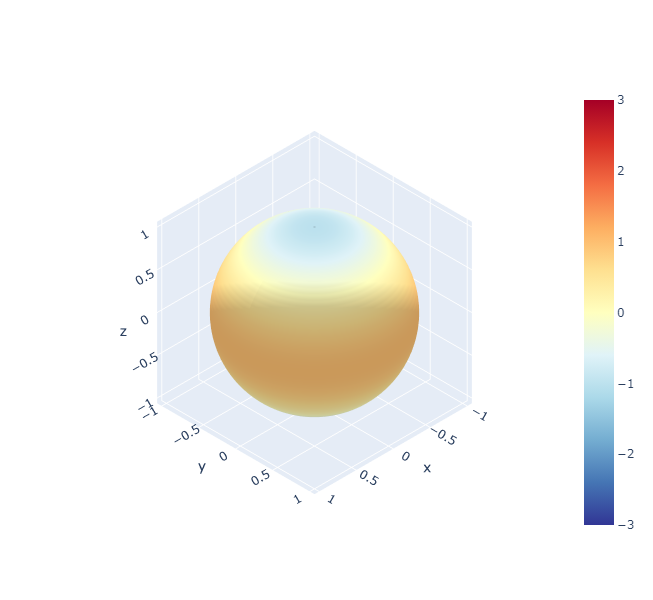

In [19]:
plotly_Q(Q7)

Rayleigh_Q_.min()
-1.0
Rayleigh_Q_.max()
1.0


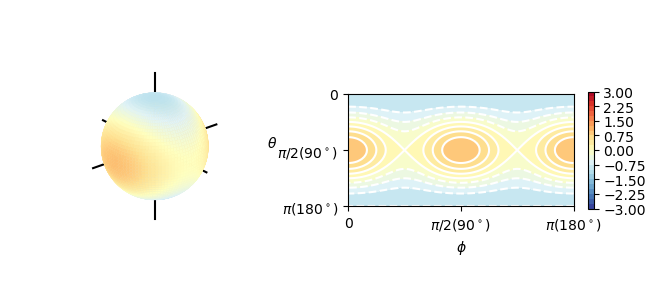

In [20]:
# 定义矩阵Q, 不定
Q8 = np.array([[1, 0, 0],
              [0, 0, 0],
              [0, 0, -1]])
visualize_Q(Q8,'Q8')

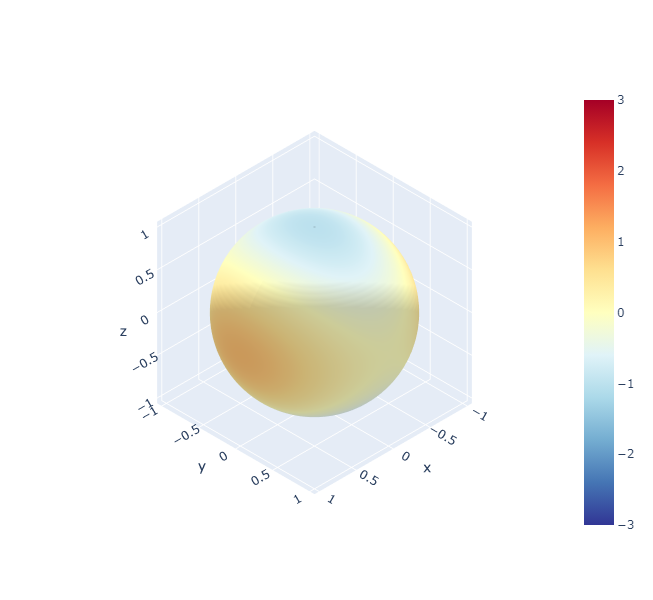

In [21]:
plotly_Q(Q8)